- Training: Saarbrucken(Near bahnhof region), AlAinRoad-DUBAI, Bauhaus, GLOBAS
- Testing: Hornbach

#### Preprocessing the data

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import glob
import rasterio
import rioxarray
import xarray as xr
from PIL import Image
import warnings
import datetime
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_auc_score

In [29]:
from collections import Counter
def check_size_most(img_path):
    ''' Finding the most occuring size of the image in the dataset'''
    # img_path = glob.glob(img_path)
    img_size = []
    for i in img_path:
        img = rioxarray.open_rasterio(i)
        img_size.append(img.shape)
    return Counter(img_size).most_common(1).pop()[0]
    
def clean_data_by_size(img_path):
    img_path = glob.glob(img_path, recursive=True)
    print("Initial size of dataset", len(img_path))
    size= check_size_most(img_path)
    print("Most common size of the dataset", size)
    #delete the images from img_path list which are not of the most common size
    for i in img_path:
        img = rioxarray.open_rasterio(i)
        if img.shape != size:
            img_path.remove(i)
    print("Final size of dataset(after removing faulty size images)", len(img_path))
    return img_path

def clean_data_by_black_pixels(img_path_list):
    black_pixels = []
    for i in img_path_list:
        img = rioxarray.open_rasterio(i)
        black_pixels.append(np.count_nonzero(img.data[0:3].transpose(1, 2, 0) == 0))
    img_path_median = []
    for i in range(len(img_path_list)):
        if black_pixels[i] <= np.median(black_pixels):
            img_path_median.append(img_path_list[i])
    print("Final size of dataset(after removing faulty black pixels in images)", len(img_path_median))
    return img_path_median

def clean_data_by_white_pixels(img_path_list, threshold=200):
    white_pixels = []
    for i in img_path_list:
        img = rioxarray.open_rasterio(i)
        white_pixels.append(np.count_nonzero(img.data[0:3].transpose(1, 2, 0)  >= threshold))

    img_path_mean_white = []
    for i in range(len(img_path_list)):
        if white_pixels[i] <= np.mean(white_pixels):
            img_path_mean_white.append(img_path_list[i])
    print("Final size of dataset(after removing faulty white pixels in images)", len(img_path_mean_white))
    return img_path_mean_white



def find_day(date_string):
    try:
        date = datetime.datetime.strptime(date_string, "%Y-%m-%d")
        day = date.strftime("%A")
        return day
    except ValueError:
        return "Invalid date format. Please provide the date in YYYY-MM-DD format."
    


def label_csv(clean_img_path):
    df = pd.DataFrame(columns=['image_path', 'day'])
    for i in clean_img_path:
        date_in = i.split('/')[-1].split('_')[0]
        year = date_in[0:4]
        month = date_in[4:6]
        day = date_in[6:8]
        date_string = f"{year}-{month}-{day}"
        df = df.append({'image_path': i, 'day': find_day(date_string)}, ignore_index=True)
    df['label'] = df['day'].apply(lambda x: 1 if x in ['Sunday'] else 0)
    print("Class distribution in dataset:", df.label.value_counts())
    return df




In [30]:
img_path_horn = "/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_horn/**/*.tif" #test

img_path_bau = "/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/**/*.tif" #train
img_path_globus = "/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_globus/**/*.tif" #train
img_path_saar = "/home/akansh-i2sc/Desktop/Research@societal/data_parking_exp_2/Saar_Parking/**/*.tif" #train
img_path_alain_dubai = '/home/akansh-i2sc/Desktop/Research@societal/data_parking_exp_2/AlAinRoad-Dubai/**/*.tif' #train

train_img_path = [img_path_bau, img_path_globus, img_path_saar, img_path_alain_dubai]
# train_img_path = [img_path_bau, img_path_saar]

test_img_path = [img_path_horn]

In [31]:
clean_train_img_path = []
clean_test_img_path = []

for img_path in train_img_path: 
    clean_1 = clean_data_by_size(img_path)
    clean_2 = clean_data_by_black_pixels(clean_1)
    clean_3 = clean_data_by_white_pixels(clean_2)
    clean_train_img_path.extend(clean_3)

for img_path in test_img_path:
    clean_1 = clean_data_by_size(img_path)
    clean_2 = clean_data_by_black_pixels(clean_1)
    clean_3 = clean_data_by_white_pixels(clean_2)
    clean_test_img_path.extend(clean_3)



Initial size of dataset 966
Most common size of the dataset (4, 158, 169)
Final size of dataset(after removing faulty size images) 952
Final size of dataset(after removing faulty black pixels in images) 830
Final size of dataset(after removing faulty white pixels in images) 745
Initial size of dataset 979
Most common size of the dataset (4, 277, 323)
Final size of dataset(after removing faulty size images) 949
Final size of dataset(after removing faulty black pixels in images) 768
Final size of dataset(after removing faulty white pixels in images) 399
Initial size of dataset 500
Most common size of the dataset (4, 525, 554)
Final size of dataset(after removing faulty size images) 454
Final size of dataset(after removing faulty black pixels in images) 237
Final size of dataset(after removing faulty white pixels in images) 225
Initial size of dataset 250
Most common size of the dataset (4, 164, 222)
Final size of dataset(after removing faulty size images) 248
Final size of dataset(after 

(-0.5, 168.5, 157.5, -0.5)

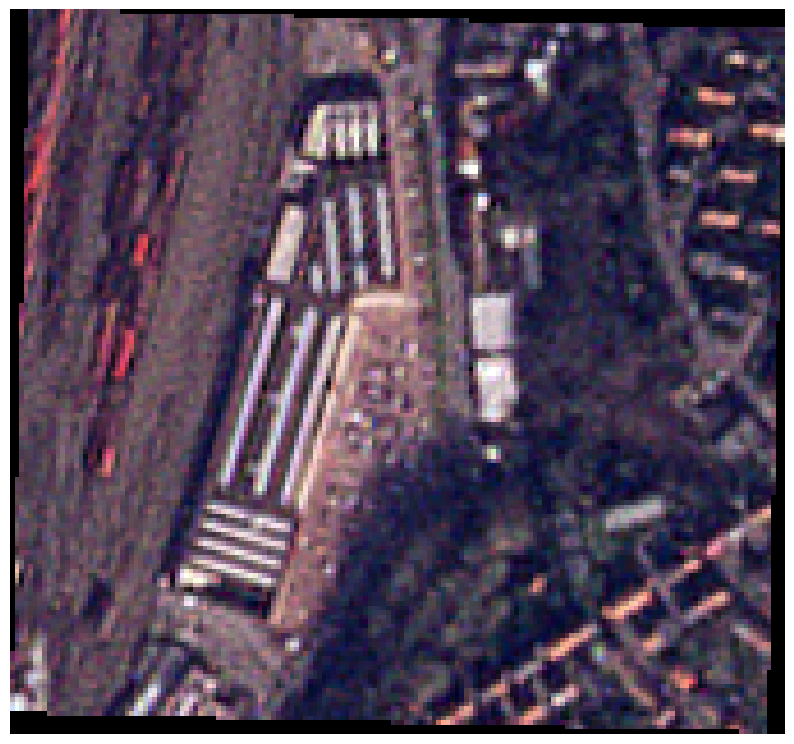

In [32]:
#plot single random image
plt.figure(figsize=(10,10))
img = rioxarray.open_rasterio(clean_train_img_path[0])
plt.imshow(img.data[0:3].transpose(1, 2, 0))
plt.axis('off')

(-0.5, 285.5, 229.5, -0.5)

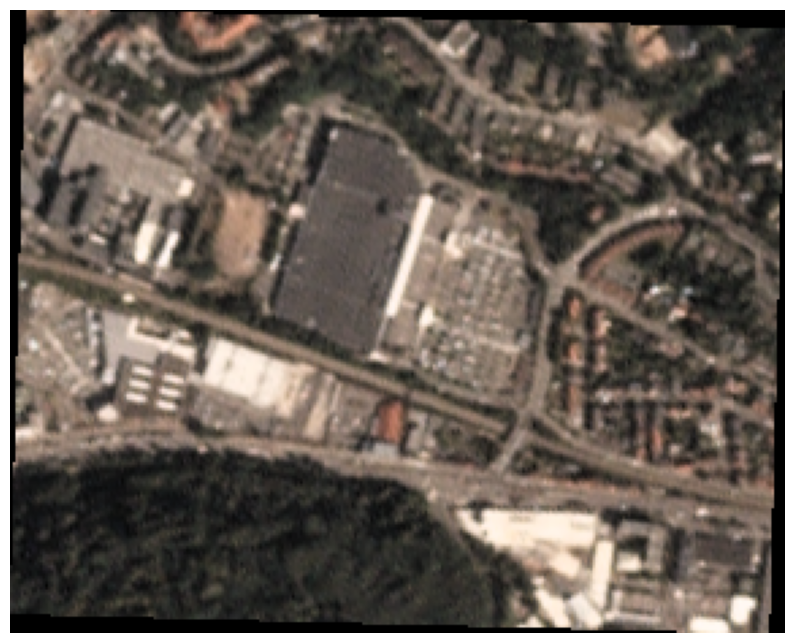

In [33]:
plt.figure(figsize=(10,10))
img = rioxarray.open_rasterio(clean_test_img_path[0])
plt.imshow(img.data[0:3].transpose(1, 2, 0))
plt.axis('off')

In [8]:
clean_train_img_path

['/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20230221_100708_07_2438_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20221123_100637_19_2479_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20220813_101904_96_227b_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20220730_100514_55_2486_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20220712_100806_43_2438_3B_Visual_clip.tif',
 '/home/akansh-i2sc/Desktop/Research@societal/data_exp_3/data_bauhaus/Bauhaus5/b723e0f5-2a54-4a58-9c25-c07fc69b0084/PSScene/20230504_093240_60_241e_3B_Visu

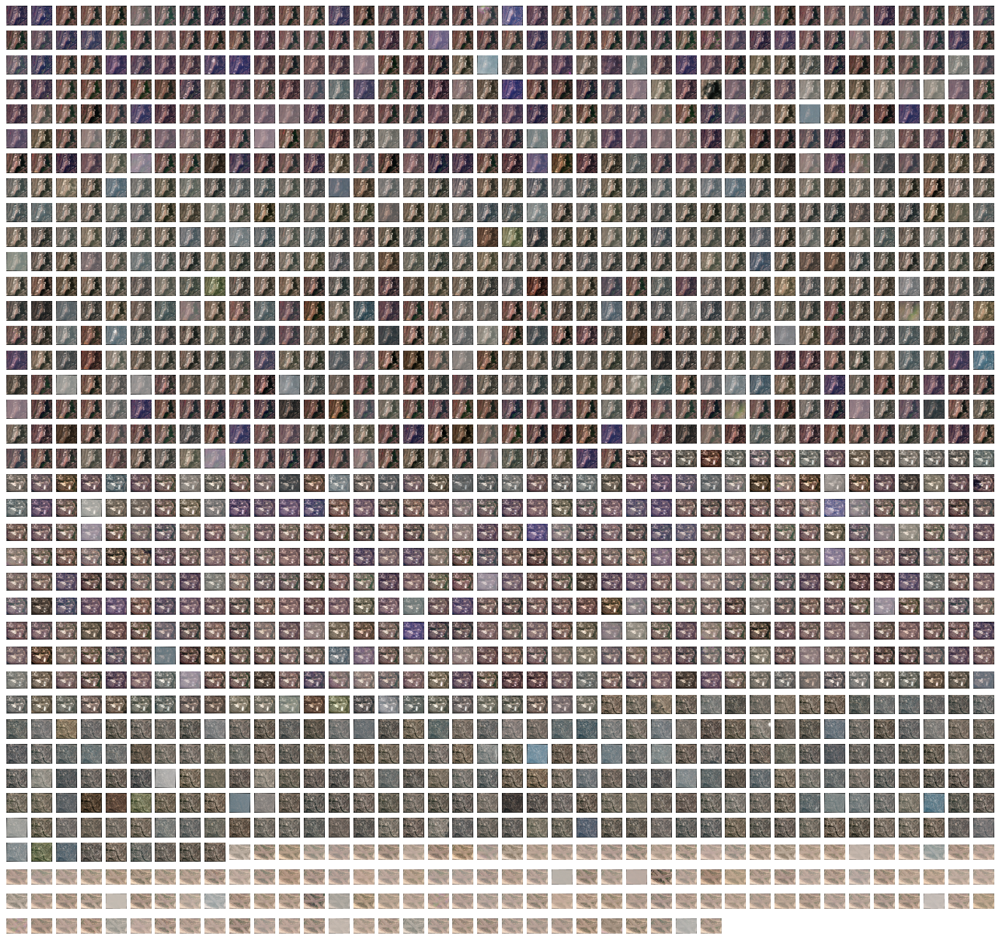

In [14]:
plt.figure(figsize=(20,20))
for i in range(len(clean_train_img_path)):
    plt.subplot(40,40,i+1)
    img = rioxarray.open_rasterio(clean_train_img_path[i])
    plt.imshow(img.data[0:3].transpose(1, 2, 0))
    plt.axis('off')

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torch.optim import Adam
from tqdm.auto import tqdm
import time
import copy
from PIL import Image


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [35]:
#create a dataframe with image path and label
df_train = label_csv(clean_train_img_path)
df_test = label_csv(clean_test_img_path)

df_train.reset_index(inplace=True, drop=True)
df_test.reset_index(inplace=True, drop=True)

print("Train size:", df_train.shape)
print("Test size:", df_test.shape)
print("Train class distribution:", df_train.label.value_counts())
print("Test class distribution:", df_test.label.value_counts())

Class distribution in dataset: 0    1308
1     201
Name: label, dtype: int64
Class distribution in dataset: 0    265
1     44
Name: label, dtype: int64
Train size: (1509, 3)
Test size: (309, 3)
Train class distribution: 0    1308
1     201
Name: label, dtype: int64
Test class distribution: 0    265
1     44
Name: label, dtype: int64


In [36]:
#custom dataset class
class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_path = self.df.image_path.values[idx]
        img = rioxarray.open_rasterio(img_path)
        img = np.array(Image.fromarray(img.data[0:3].transpose(1, 2, 0)).resize((128,128)))
        label = self.df.label.values[idx]
        if self.transform:
            img = self.transform(img)
        return img, label

#data augmentation
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=45),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225]),
])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225]),
])

#dataset and dataloader
train_dataset = CustomDataset(df_train, transform=train_transform)
test_dataset = CustomDataset(df_test, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

#model with resnet18 and fc layer pretrained on imagenet weights freezed

model = torchvision.models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = True
model.fc = nn.Linear(512, 2)
model = model.to(device)

#loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)


#training and validation, also calculating AUC scores for train and test set
def train_model(model, criterion, optimizer, num_epochs=10):
    train_loss = []
    train_acc = []
    train_auc = []
    val_loss = []
    val_acc = []
    val_auc = []
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    for epoch in tqdm(range(num_epochs)):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        since = time.time()
        # Each epoch has a training and validation phase
        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()  
            else:
                model.eval()   
            running_loss = 0.0
            running_corrects = 0
            y_pred = []
            y_true = []
            # Iterate over data.
            for inputs, labels in tqdm(eval(phase+'_loader')):
                inputs = inputs.to(device)
                labels = labels.to(device)
                # zero the parameter gradients
                optimizer.zero_grad()
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                y_pred.extend(preds.cpu().numpy())
                y_true.extend(labels.cpu().numpy())
            epoch_loss = running_loss / len(eval(phase+'_loader').dataset)
            epoch_acc = running_corrects.double() / len(eval(phase+'_loader').dataset)
            epoch_auc = roc_auc_score(y_true, y_pred)
            print('{} Loss: {:.4f} Acc: {:.4f} AUC: {:.4f}'.format(
                phase, epoch_loss, epoch_acc, epoch_auc))
            if phase == 'train':
                train_loss.append(epoch_loss)
                train_acc.append(epoch_acc)
                train_auc.append(epoch_auc)
            else:
                val_loss.append(epoch_loss)
                val_acc.append(epoch_acc)
                val_auc.append(epoch_auc)
            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_auc = epoch_auc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), '/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_mix_exp_3_1.pt')
        print()
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    print('Best val AUC: {:4f}'.format(best_auc))
    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, train_loss, train_acc, val_loss, val_acc, train_auc, val_auc


model, train_loss, train_acc, val_loss, val_acc, train_auc, val_auc = train_model(model, criterion, optimizer, num_epochs=30)




  0%|          | 0/30 [00:00<?, ?it/s]

Epoch 0/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.4885 Acc: 0.7985 AUC: 0.5069


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4485 Acc: 0.8511 AUC: 0.4962

Epoch 1/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.3824 Acc: 0.8575 AUC: 0.5325


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4672 Acc: 0.8252 AUC: 0.5664

Epoch 2/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.3409 Acc: 0.8708 AUC: 0.5718


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.9245 Acc: 0.3269 AUC: 0.5791

Epoch 3/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.3474 Acc: 0.8721 AUC: 0.5894


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4327 Acc: 0.8738 AUC: 0.5663

Epoch 4/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.3194 Acc: 0.8814 AUC: 0.6474


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5870 Acc: 0.7508 AUC: 0.6367

Epoch 5/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2841 Acc: 0.8960 AUC: 0.6600


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4272 Acc: 0.8576 AUC: 0.5000

Epoch 6/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2754 Acc: 0.8920 AUC: 0.6556


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4854 Acc: 0.8641 AUC: 0.6175

Epoch 7/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2545 Acc: 0.9039 AUC: 0.7004


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4538 Acc: 0.8932 AUC: 0.6345

Epoch 8/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2533 Acc: 0.9059 AUC: 0.7162


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4336 Acc: 0.8738 AUC: 0.5663

Epoch 9/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2448 Acc: 0.9059 AUC: 0.6973


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4352 Acc: 0.8997 AUC: 0.7046

Epoch 10/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2278 Acc: 0.9132 AUC: 0.7457


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4192 Acc: 0.8479 AUC: 0.6649

Epoch 11/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2162 Acc: 0.9211 AUC: 0.7713


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5160 Acc: 0.7476 AUC: 0.7391

Epoch 12/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2121 Acc: 0.9158 AUC: 0.7620


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4944 Acc: 0.8382 AUC: 0.6972

Epoch 13/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.2062 Acc: 0.9192 AUC: 0.7702


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5204 Acc: 0.8220 AUC: 0.7920

Epoch 14/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1972 Acc: 0.9218 AUC: 0.7780


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5769 Acc: 0.7055 AUC: 0.7620

Epoch 15/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1913 Acc: 0.9271 AUC: 0.7853


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.3991 Acc: 0.8803 AUC: 0.7217

Epoch 16/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1812 Acc: 0.9331 AUC: 0.8014


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5308 Acc: 0.7799 AUC: 0.7864

Epoch 17/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1977 Acc: 0.9205 AUC: 0.7647


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4758 Acc: 0.8511 AUC: 0.7711

Epoch 18/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1991 Acc: 0.9291 AUC: 0.8033


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.4901 Acc: 0.8608 AUC: 0.7293

Epoch 19/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1605 Acc: 0.9357 AUC: 0.8113


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5639 Acc: 0.7120 AUC: 0.6994

Epoch 20/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1823 Acc: 0.9317 AUC: 0.7880


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.9338 Acc: 0.3398 AUC: 0.5961

Epoch 21/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1788 Acc: 0.9337 AUC: 0.8102


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5640 Acc: 0.7087 AUC: 0.7354

Epoch 22/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1493 Acc: 0.9483 AUC: 0.8418


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5853 Acc: 0.6602 AUC: 0.6692

Epoch 23/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1635 Acc: 0.9410 AUC: 0.8207


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.6457 Acc: 0.5793 AUC: 0.6789

Epoch 24/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1728 Acc: 0.9351 AUC: 0.8131


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5643 Acc: 0.7184 AUC: 0.7221

Epoch 25/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1778 Acc: 0.9324 AUC: 0.7989


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5449 Acc: 0.6958 AUC: 0.7279

Epoch 26/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1508 Acc: 0.9470 AUC: 0.8326


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.9883 Acc: 0.3722 AUC: 0.5866

Epoch 27/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1609 Acc: 0.9384 AUC: 0.8171


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.7205 Acc: 0.5113 AUC: 0.6393

Epoch 28/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1559 Acc: 0.9417 AUC: 0.8337


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.7602 Acc: 0.5631 AUC: 0.7169

Epoch 29/29
----------


  0%|          | 0/48 [00:00<?, ?it/s]

train Loss: 0.1565 Acc: 0.9423 AUC: 0.8236


  0%|          | 0/10 [00:00<?, ?it/s]

test Loss: 0.5673 Acc: 0.7055 AUC: 0.7525

Training complete in 0m 12s
Best val Acc: 0.899676
Best val AUC: 0.704588


In [37]:
train_acc_values = []
for index in range(len(train_acc)):
    train_acc_values.append(train_acc[index].item())

val_acc_values = []
for index in range(len(val_acc)):
    val_acc_values.append(val_acc[index].item())

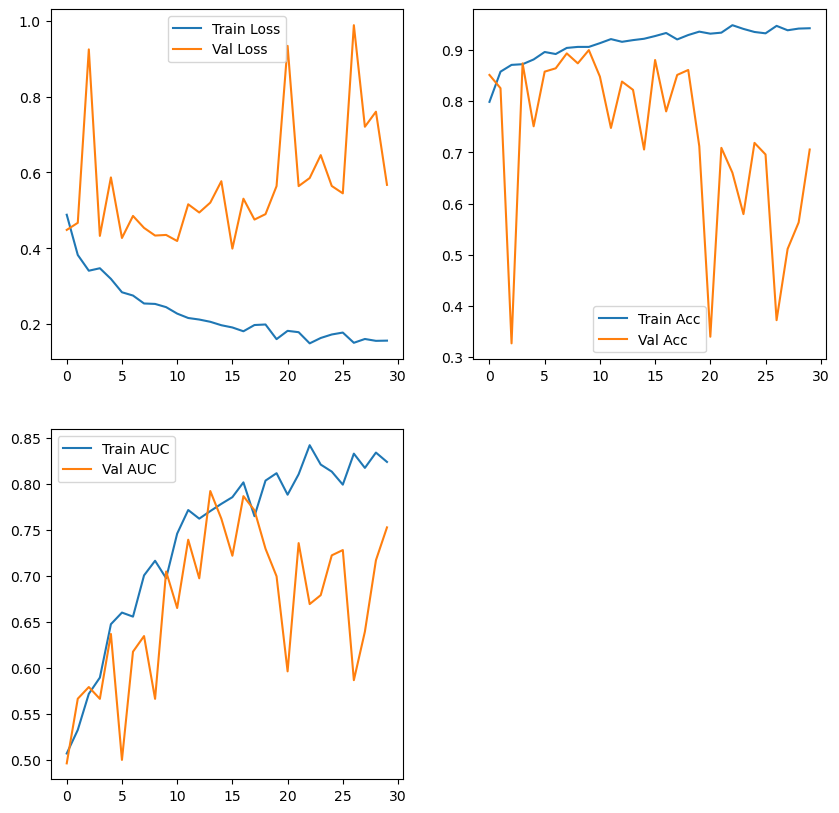

In [38]:
#plotting the loss and accuracy curves, AUC scores for train and test set
plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.subplot(2, 2, 2)
plt.plot(train_acc_values, label='Train Acc')
plt.plot(val_acc_values, label='Val Acc')
plt.legend()
plt.subplot(2, 2, 3)
plt.plot(train_auc, label='Train AUC')
plt.plot(val_auc, label='Val AUC')
plt.legend()
plt.show()


##### Old train loop

In [39]:
# def train_model(model, criterion, optimizer, num_epochs=10):
#     since = time.time()
#     best_model_wts = copy.deepcopy(model.state_dict())
#     best_acc = 0.0
#     train_loss = []
#     val_loss = []
#     train_acc = []
#     val_acc = []
#     for epoch in range(num_epochs):
#         print(f"Epoch {epoch+1}/{num_epochs}")
#         print("-"*10)
#         running_loss = 0.0
#         running_corrects = 0
#         for inputs, labels in tqdm(train_loader):
#             inputs = inputs.to(device)
#             labels = labels.to(device)
#             optimizer.zero_grad()
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             _, preds = torch.max(outputs, 1)
#             loss.backward()
#             optimizer.step()
#             running_loss += loss.item()*inputs.size(0)
#             running_corrects += torch.sum(preds == labels.data)
#         epoch_loss = running_loss/len(train_dataset)
#         epoch_acc = running_corrects.double()/len(train_dataset)
#         train_loss.append(epoch_loss)
#         train_acc.append(epoch_acc)
#         print(f"Train loss: {epoch_loss:.4f} Train acc: {epoch_acc:.4f}")
#         model.eval()
#         running_loss = 0.0
#         running_corrects = 0
#         for inputs, labels in tqdm(test_loader):
#             inputs = inputs.to(device)
#             labels = labels.to(device)
#             with torch.no_grad():
#                 outputs = model(inputs)
#                 loss = criterion(outputs, labels)
#                 _, preds = torch.max(outputs, 1)
#                 running_loss += loss.item()*inputs.size(0)
#                 running_corrects += torch.sum(preds == labels.data)
#         epoch_loss = running_loss/len(test_dataset)
#         epoch_acc = running_corrects.double()/len(test_dataset)
#         val_loss.append(epoch_loss)
#         val_acc.append(epoch_acc)
#         print(f"Val loss: {epoch_loss:.4f} Val acc: {epoch_acc:.4f}")
#         if epoch_acc > best_acc:
#             best_acc = epoch_acc
#             best_model_wts = copy.deepcopy(model.state_dict())
#     time_elapsed = time.time() - since
#     print(f"Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s")
#     print(f"Best val acc: {best_acc:4f}")
#     model.load_state_dict(best_model_wts)
#     return model, train_loss, train_acc, val_loss, val_acc

#### Plots

In [40]:
inputs, classes = next(iter(test_loader)) 
inputs = inputs.to(device)
classes = classes.to(device)
outputs = model(inputs)
_, preds = torch.max(outputs, 1)
print(preds)
print(classes)

tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')
tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')


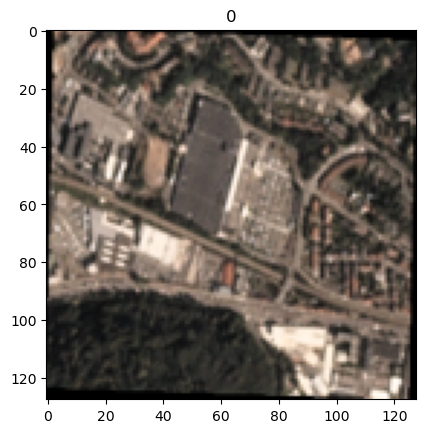

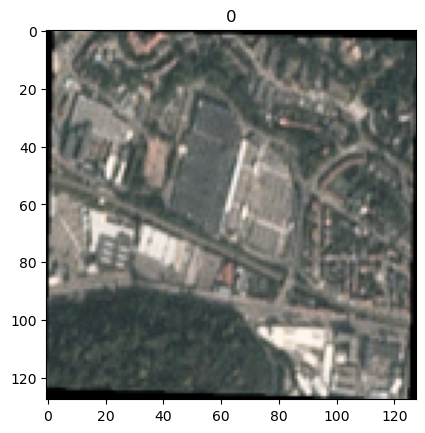

In [41]:
#renormalize the image with imagenet mean and std to display it
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
inp = std * inputs[0].cpu().numpy().transpose((1, 2, 0)) + mean
inp = np.clip(inp, 0, 1)
plt.imshow(inp)
plt.title(preds[0].item())
plt.show()

#plot another image
inp = std * inputs[1].cpu().numpy().transpose((1, 2, 0)) + mean
inp = np.clip(inp, 0, 1)
plt.imshow(inp)
plt.title(preds[1].item())
plt.show()


In [42]:
#save the model
# torch.save(model.state_dict(), '/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_horn_exp_3.pt')

#### Grad cam on model

In [43]:
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18

In [44]:
model_test = resnet18(pretrained=False)
model_test.fc = nn.Linear(512, 2)
model_test.load_state_dict(torch.load('/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_mix_exp_3_1.pt'))

<All keys matched successfully>

Predicted label: 0
original class 0


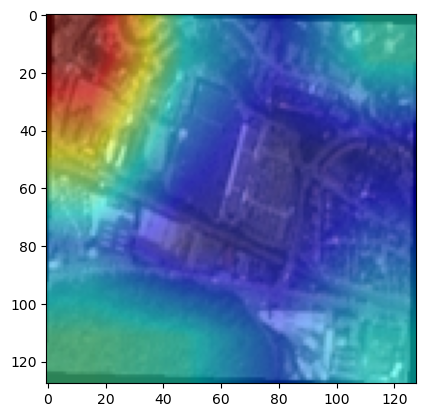

In [45]:
idx = 3
input_tensor = inputs[idx]
print("Predicted label:", preds[idx].cpu().item())
print("original class", classes[idx].cpu().item())
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)

Predicted label: 0
original class 1


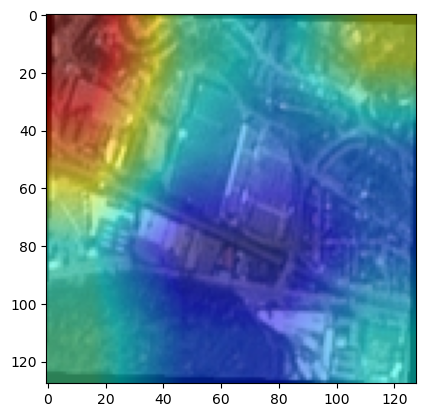

In [46]:
idx = 1
input_tensor = inputs[idx]
print("Predicted label:", preds[idx].cpu().item())
print("original class", classes[idx].cpu().item())
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)

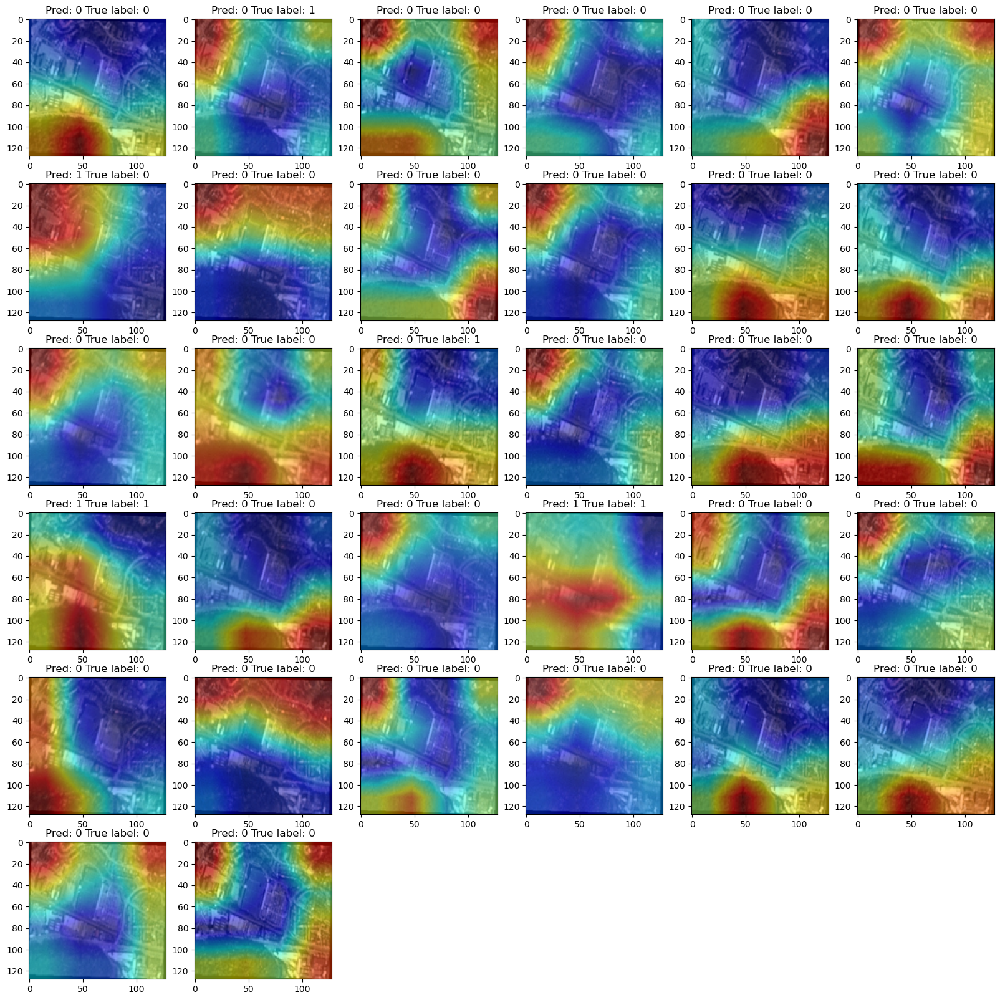

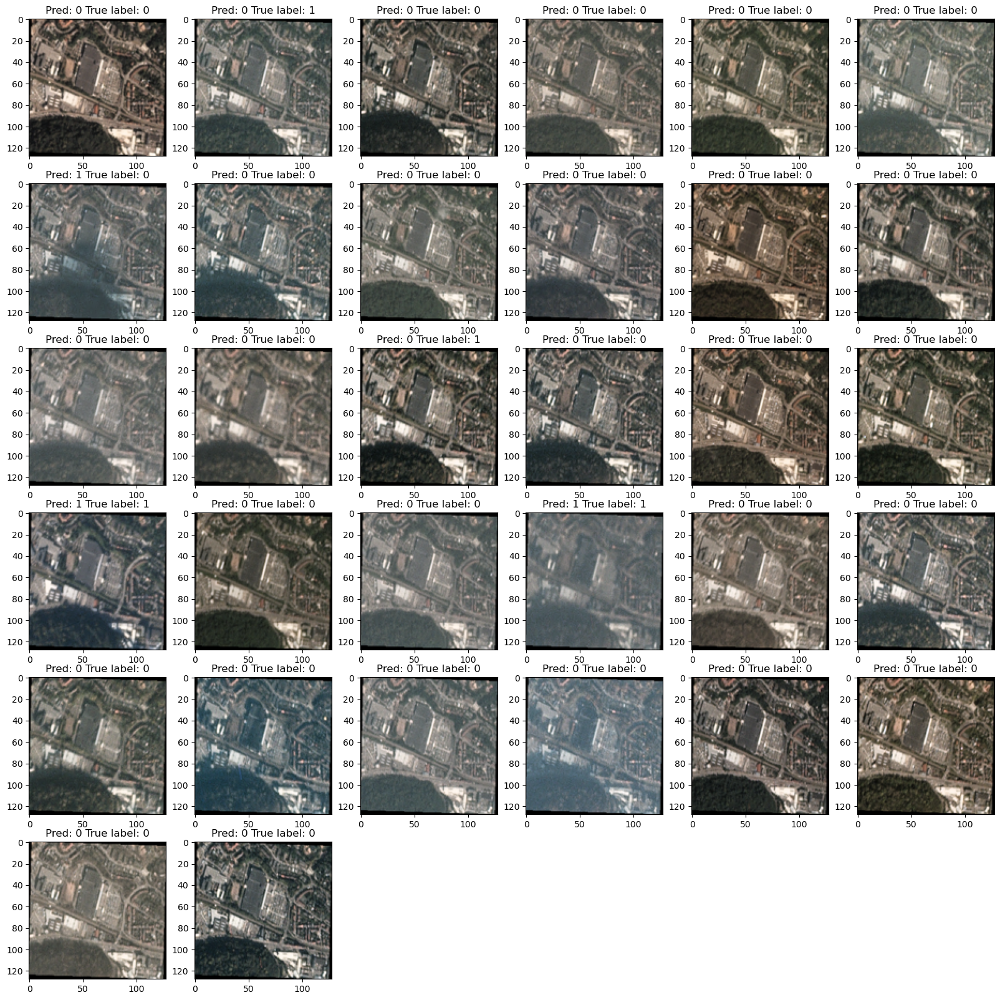

In [47]:
#plot all the images in test set with gradcam
plt.figure(figsize=(20, 20))
for idx in range(inputs.shape[0]):
    input_tensor = inputs[idx]
    target_layers = [model_test.layer4[-1]]
    cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
    grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))
    grayscale_cam = grayscale_cam[0, :]
    # grayscale_cam = 1-grayscale_cam
    inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean
    rgb_img = np.clip(inp, 0, 1)
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    plt.subplot(6, 6, idx+1)
    plt.imshow(visualization)
    plt.title(f"Pred: {preds[idx].item()} True label: {classes[idx].item()}")
plt.show()

plt.figure(figsize=(20, 20))
for idx in range(inputs.shape[0]):
    input_tensor = inputs[idx]
    inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean
    rgb_img = np.clip(inp, 0, 1)
    plt.subplot(6, 6, idx+1)
    plt.imshow(rgb_img)
    plt.title(f"Pred: {preds[idx].item()} True label: {classes[idx].item()}")
plt.show()

    

#### inference of model

In [48]:
def create_median_image(images_path):

    first_img = rioxarray.open_rasterio(images_path[0])

    width, height = first_img.data[0:3].transpose(1, 2, 0).shape[0:2]
    num_images = len(images_path)

    red_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    green_values = np.zeros(( width,height, num_images), dtype=np.uint8)
    blue_values = np.zeros(( width,height, num_images), dtype=np.uint8)


    for i,j in enumerate(images_path):
        img = rioxarray.open_rasterio(j).data[0:3].transpose(1, 2, 0)
        try:
            red_values[:, :, i], green_values[:, :, i], blue_values[:, :, i] = img[:, :, 0], img[:, :, 1], img[:, :, 2]
        except:
            pass
    
    red_median = np.median(red_values, axis=2)
    green_median = np.median(green_values, axis=2)
    blue_median = np.median(blue_values, axis=2)
    img_arr = np.uint8(np.dstack((red_median, green_median, blue_median)))
    median_image = Image.fromarray(img_arr)
    
    return img_arr, median_image

In [49]:
median_image, _ = create_median_image(glob.glob(img_path_horn, recursive=True))

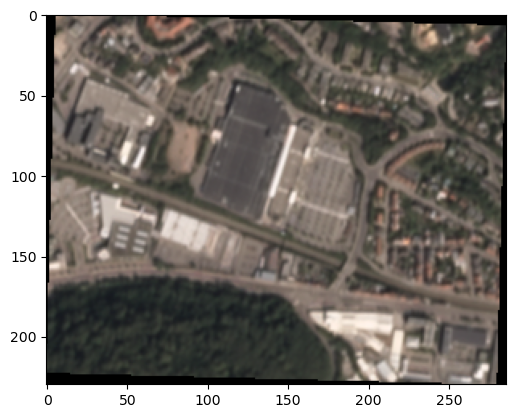

In [50]:
plt.imshow(median_image)

In [51]:
#inference on any image

from PIL import Image
from torchvision import transforms
import torch.nn.functional as F
from torch import nn
from torchvision.models import resnet18

test_transforms = transforms.Compose([transforms.ToPILImage(),
                                        transforms.ToTensor(),
                                        transforms.Normalize([0.485, 0.456, 0.406],
                                                                [0.229, 0.224, 0.225])])



img = test_transforms(median_image)
img = img.unsqueeze(0)
img = img.to("cpu")




#load the model
model_test = resnet18(pretrained=False)
model_test.fc = nn.Linear(512, 2)
model_test.load_state_dict(torch.load('/home/akansh-i2sc/Desktop/Research@societal/detect-car-LR/temp/models/model_mix_exp_3_1.pt'))
model_test.eval()

#inference
with torch.no_grad():
    output = model_test(img)
    ps = F.softmax(output, dim=1)
    top_p, top_class = ps.topk(1, dim=1)
    print(top_class.item())




0


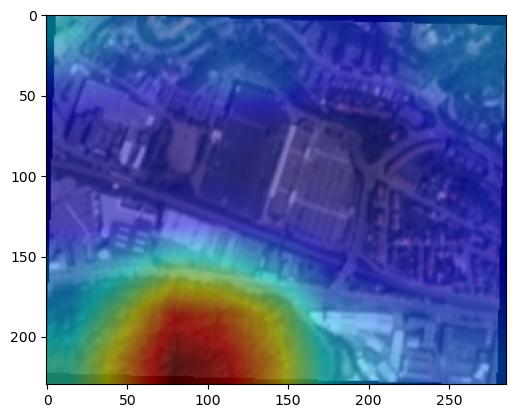

In [52]:
#gradcam on median image
input_tensor = img.squeeze(0)
preds = top_class
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

target_layers = [model_test.layer4[-1]]
cam = GradCAMPlusPlus(model=model_test, target_layers=target_layers, use_cuda=True)
grayscale_cam = cam(input_tensor=input_tensor.unsqueeze(0))

grayscale_cam = grayscale_cam[0, :]
grayscale_cam = 1-grayscale_cam

inp = std * input_tensor.cpu().numpy().transpose((1, 2, 0)) + mean

rgb_img = np.clip(inp, 0, 1)

visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=False)
plt.imshow(visualization)